In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
!pip install tensorflow_addons

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
import tensorflow_addons as tfa
from kaggle_datasets import KaggleDatasets

import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
from random import random

try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except Exception as e:
    print(e)
    strategy = tf.distribute.get_strategy()
print('Number of replicas:', strategy.num_replicas_in_sync)

AUTOTUNE = tf.data.experimental.AUTOTUNE
    
print(tf.__version__)

Please provide a TPU Name to connect to.
Number of replicas: 1
2.4.1


In [3]:
GCS_PATH = KaggleDatasets().get_gcs_path("gan-getting-started")

MONET_FILENAMES = tf.io.gfile.glob(str(GCS_PATH + '/monet_tfrec/*.tfrec'))
print('Monet TFRecord Files:', len(MONET_FILENAMES))

PHOTO_FILENAMES = tf.io.gfile.glob(str(GCS_PATH + '/photo_tfrec/*.tfrec'))
print('Photo TFRecord Files:', len(PHOTO_FILENAMES))

Monet TFRecord Files: 5
Photo TFRecord Files: 20


In [4]:
IMAGE_SIZE = [256, 256]
BATCH_SIZE = 4


def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 255)
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image


def read_tfrecord(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image


def augment_image(image):
    flip_image = tf.image.random_flip_left_right(image)
    return flip_image

def load_dataset(filenames, labeled=True, ordered=False, augment=False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    if augment:
        dataset = dataset.map(augment_image, num_parallel_calls=AUTOTUNE)
        dataset = dataset.repeat(count=2)
    return dataset

In [5]:
monet_ds = load_dataset(MONET_FILENAMES, labeled=True, augment=False).take(1).repeat(BATCH_SIZE)
photo_ds = load_dataset(PHOTO_FILENAMES, labeled=True, augment=False)
style_image = next(iter(monet_ds))

# 10 batches
train_ds = photo_ds.take(10).map(lambda x: (x, style_image)).batch(BATCH_SIZE, drop_remainder=True).repeat(10000)
# whole training set:
# train_ds = photo_ds.map(lambda x: (x, style_image)).batch(BATCH_SIZE, drop_remainder=True).repeat(100)
monet_ds = monet_ds.batch(BATCH_SIZE, drop_remainder=True)
photo_ds = photo_ds.shuffle(buffer_size=2*BATCH_SIZE).repeat(100).batch(BATCH_SIZE, drop_remainder=True)
photo_ds_test = load_dataset(PHOTO_FILENAMES, labeled=True, augment=False).batch(BATCH_SIZE, drop_remainder=True)

In [6]:
i_monet= iter(monet_ds)
i_photo = iter(photo_ds)

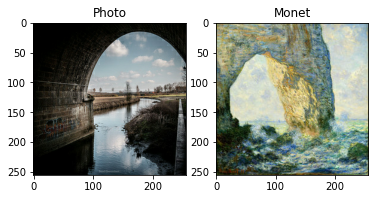

In [7]:
example_monet = next(i_monet)
example_photo = next(i_photo)

plt.subplot(121)
plt.title('Photo')
plt.imshow(example_photo[0])

plt.subplot(122)
plt.title('Monet')
plt.imshow(example_monet[0])

In [8]:
model = tf.keras.applications.VGG19(
    include_top=False, weights='imagenet', input_tensor=None,
    input_shape=(256, 256, 3), pooling=None, classes=1000,
    classifier_activation='softmax'
)

80142336/80134624 [==============================] - 1s 0us/step


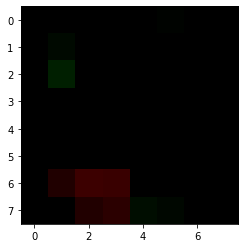

In [9]:
import tensorflow as tf
from PIL import Image
import PIL
import numpy as np
IMAGE_SIZE = [256, 256]

NUM_BOXES = 1
IMAGE_HEIGHT = 256
IMAGE_WIDTH = 256
CHANNELS = 3
CROP_SIZE = (224, 224)


#print(vgg19.decode_predictions(output))


print(model)
predict = model.predict(example_monet)

plt.imshow(predict[0][:,:,9:12])

style_image = example_monet
content_image = example_photo

def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

In [10]:
content_layers = ['block5_conv2'] 

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

def vgg_layers(layer_names):
  """ Creates a vgg model that returns a list of intermediate output values."""
  # Load our model. Load pretrained VGG, trained on imagenet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)

print()
for layer in model.layers:
  print(layer.name)

#Look at the statistics of each layer's output
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  shape: ", output.numpy().shape)
  print("  min: ", output.numpy().min())
  print("  max: ", output.numpy().max())
  print("  mean: ", output.numpy().mean())
  print()

def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)


input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool
block1_conv1
  shape:  (4, 256, 256, 64)
  min:  0.0
  max:  781.5481
  mean:  28.712019

block2_conv1
  shape:  (4, 128, 128, 128)
  min:  0.0
  max:  2985.1204
  mean:  166.11641

block3_conv1
  shape:  (4, 64, 64, 256)
  min:  0.0
  max:  6792.0054
  mean:  143.91693

block4_conv1
  shape:  (4, 32, 32, 512)
  min:  0.0
  max:  15854.194
  mean:  594.39746

block5_conv1
  shape:  (4, 16, 16, 512)
  min:  0.0
  max:  1933.5983
  mean:  42.69348



In [11]:
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg =  vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input, training=False)
    style_outputs, content_outputs = (outputs[:self.num_style_layers], 
                                      outputs[self.num_style_layers:])

    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

    content_dict = {content_name:value 
                    for content_name, value 
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name:value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content':content_dict, 'style':style_dict}
with strategy.scope():
  extractor = StyleContentModel(style_layers, content_layers)


In [12]:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']
image = tf.Variable(content_image)
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
style_weight=1e-2
content_weight=1e3
total_variation_weight=10

def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    loss += total_variation_weight*tf.image.total_variation(image)
    return loss

@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

In [13]:
class Residual(layers.Layer):
    def __init__(self, filters=64, conv_shape=(3,3)):
        super(Residual, self).__init__()
        self.sequentials = models.Sequential([layers.Conv2D(filters, conv_shape, padding='same'),
                                             layers.BatchNormalization(),
                                             layers.ReLU(),
                                             layers.Conv2D(filters, conv_shape, padding='same'),
                                             layers.BatchNormalization()])
        
    def call(self, inputs):
        seq_out = self.sequentials(inputs)
        return seq_out+inputs

In [14]:
class JohnsonModel(tf.keras.Model):
  def __init__(self, extractor):
    super(JohnsonModel, self).__init__(name='')
    self.extractor = extractor
    self.transformation_network = models.Sequential(
        [keras.Input(shape=(256, 256, 3), batch_size=BATCH_SIZE),
         layers.Conv2D(32, (9, 9), strides=1, padding='same'),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2D(64, (3, 3), strides=2, padding='same'),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2D(128, (3, 3), strides=2, padding='same'),
        layers.BatchNormalization(),
        layers.ReLU(),
        Residual(128, (3,3)),
        Residual(128, (3,3)),
        Residual(128, (3,3)),
        Residual(128, (3,3)),
        Residual(128, (3,3)),
         
        layers.UpSampling2D(size=(2,2)),
        layers.Conv2D(64, (3, 3), strides=1, padding='same'),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.UpSampling2D(size=(2,2)),
        layers.Conv2D(32, (3, 3), strides=1, padding='same'),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2D(3, (9, 9), strides=(1), activation='sigmoid', padding='same')
        # layers.Conv2D(3, (9, 9), strides=(1), activation='tanh', padding='same'),
        # layers.experimental.preprocessing.Rescaling(127.5, offset=127.5)
        ])

  def compile(self, optimizer):
      super(JohnsonModel, self).compile()
      self.optimizer = optimizer

  def style_content_loss(self, outputs, content_targets, style_targets):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])

    num_style_layers = len(style_targets)
    style_weight=1e-2
    content_weight=1e3

    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    num_content_layers = len(content_targets)
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

  def train_step(self, data):
    total_variation_weight = 10
    image, style_target_image = data
    style_targets = self.extractor(style_target_image)['style']
    with tf.GradientTape() as tape:
      transformed_image = self.transformation_network(image)
      outputs = self.extractor(transformed_image)
      content_targets = self.extractor(image)['content']
      #loss = tf.keras.losses.MSE(image, transformed_image)
      loss = self.style_content_loss(outputs, content_targets, style_targets)
      loss += total_variation_weight*tf.image.total_variation(image)
      print(loss)
    grads = tape.gradient(loss, self.transformation_network.trainable_variables)
    self.optimizer.apply_gradients(zip(grads, self.transformation_network.trainable_variables))

  def call(self, input_tensor, training=False):
    content_image = input_tensor
    transformed_image = self.transformation_network(content_image)
    return transformed_image

In [15]:
iter_train = iter(train_ds)

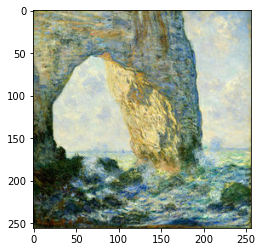

tf.Tensor([2.4470296e+08 2.4477907e+08 2.4488616e+08 2.4478851e+08], shape=(4,), dtype=float32)
tf.Tensor([2.4321419e+08 2.4329824e+08 2.4317029e+08 2.4314917e+08], shape=(4,), dtype=float32)
tf.Tensor([2.3469754e+08 2.3477365e+08 2.3488074e+08 2.3478309e+08], shape=(4,), dtype=float32)
tf.Tensor([2.2837926e+08 2.2846331e+08 2.2833536e+08 2.2831424e+08], shape=(4,), dtype=float32)
tf.Tensor([2.1422730e+08 2.1430341e+08 2.1441050e+08 2.1431285e+08], shape=(4,), dtype=float32)
tf.Tensor([2.0507045e+08 2.0515450e+08 2.0502654e+08 2.0500542e+08], shape=(4,), dtype=float32)
tf.Tensor([2.0159854e+08 2.0167466e+08 2.0178174e+08 2.0168410e+08], shape=(4,), dtype=float32)
tf.Tensor([1.9232266e+08 1.9240670e+08 1.9227875e+08 1.9225763e+08], shape=(4,), dtype=float32)
tf.Tensor([1.9453714e+08 1.9461325e+08 1.9472034e+08 1.9462269e+08], shape=(4,), dtype=float32)
tf.Tensor([1.8516747e+08 1.8525152e+08 1.8512357e+08 1.8510245e+08], shape=(4,), dtype=float32)
tf.Tensor([1.8296942e+08 1.8304554e+08 1

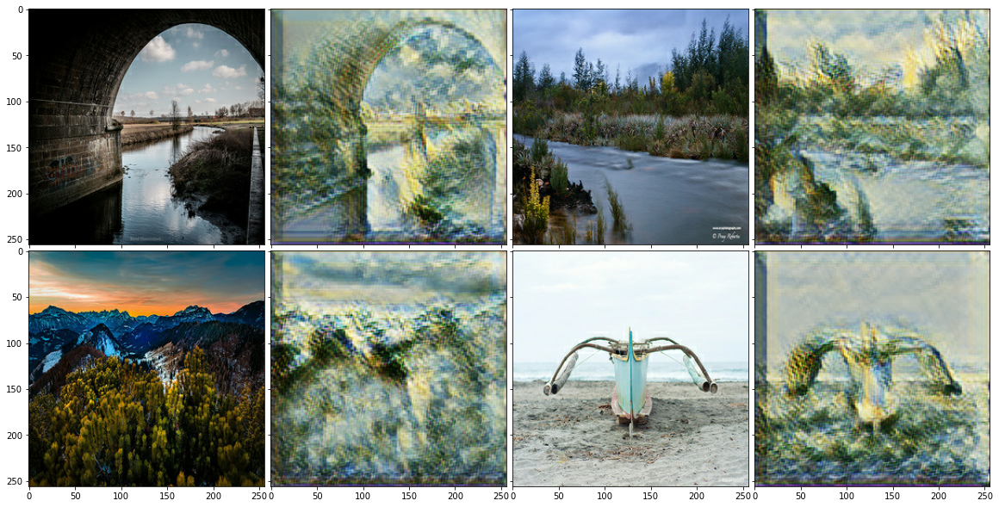

tf.Tensor([2228380.  2304486.8 2411578.8 2313931.8], shape=(4,), dtype=float32)
tf.Tensor([2713547.2 2797606.8 2669648.8 2648534. ], shape=(4,), dtype=float32)
tf.Tensor([2228990.8 2305097.5 2412189.5 2314542.5], shape=(4,), dtype=float32)
tf.Tensor([2704514.  2788573.5 2660615.5 2639500.8], shape=(4,), dtype=float32)
tf.Tensor([2228788.5 2304895.2 2411987.2 2314340.2], shape=(4,), dtype=float32)
tf.Tensor([2703874.8 2787934.2 2659976.2 2638861.5], shape=(4,), dtype=float32)
tf.Tensor([2224419.5 2300526.2 2407618.2 2309971.2], shape=(4,), dtype=float32)
tf.Tensor([2707577.  2791636.5 2663678.5 2642563.8], shape=(4,), dtype=float32)
tf.Tensor([2220644.2 2296751.  2403843.  2306196. ], shape=(4,), dtype=float32)
tf.Tensor([2709402.  2793461.5 2665503.5 2644388.8], shape=(4,), dtype=float32)
tf.Tensor([2220006.5 2296113.2 2403205.2 2305558.2], shape=(4,), dtype=float32)
tf.Tensor([2703907.8 2787967.2 2660009.2 2638894.5], shape=(4,), dtype=float32)
tf.Tensor([2224004.  2300110.8 2407202.8

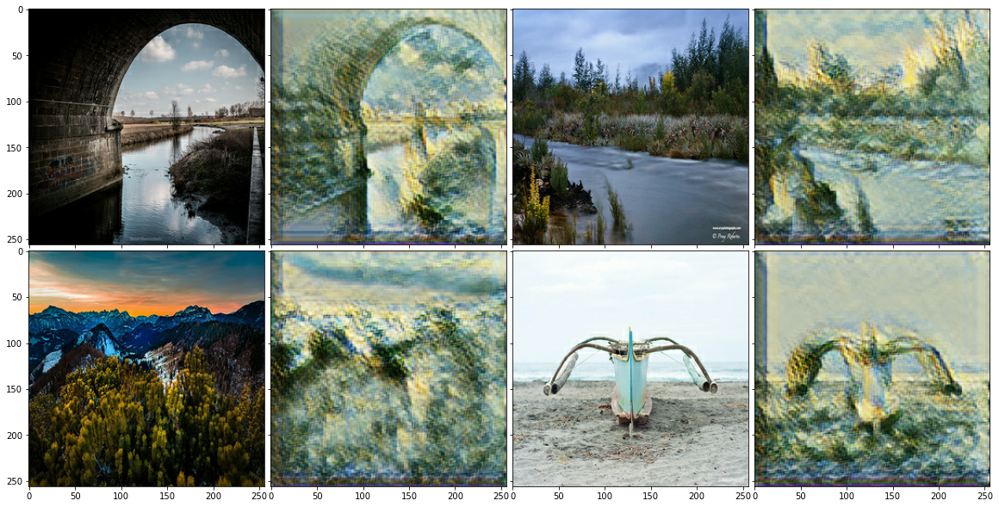

tf.Tensor([2543441.5 2619548.2 2726640.2 2628993.2], shape=(4,), dtype=float32)
tf.Tensor([3099720.  3183779.5 3055821.5 3034706.8], shape=(4,), dtype=float32)
tf.Tensor([2583474.5 2659581.2 2766673.2 2669026.2], shape=(4,), dtype=float32)
tf.Tensor([2758369.  2842428.5 2714470.5 2693355.8], shape=(4,), dtype=float32)
tf.Tensor([2423968.5 2500075.2 2607167.2 2509520.2], shape=(4,), dtype=float32)
tf.Tensor([2841892.5 2925952.  2797994.  2776879.2], shape=(4,), dtype=float32)
tf.Tensor([2289835.2 2365942.  2473034.  2375387. ], shape=(4,), dtype=float32)
tf.Tensor([2675033.5 2759093.  2631135.  2610020.2], shape=(4,), dtype=float32)
tf.Tensor([2324991.  2401097.8 2508189.8 2410542.8], shape=(4,), dtype=float32)
tf.Tensor([2594697.  2678756.5 2550798.5 2529683.8], shape=(4,), dtype=float32)
tf.Tensor([2144521.5 2220628.2 2327720.2 2230073.2], shape=(4,), dtype=float32)
tf.Tensor([2628403.  2712462.5 2584504.5 2563389.8], shape=(4,), dtype=float32)
tf.Tensor([2134077.2 2210184.  2317276. 

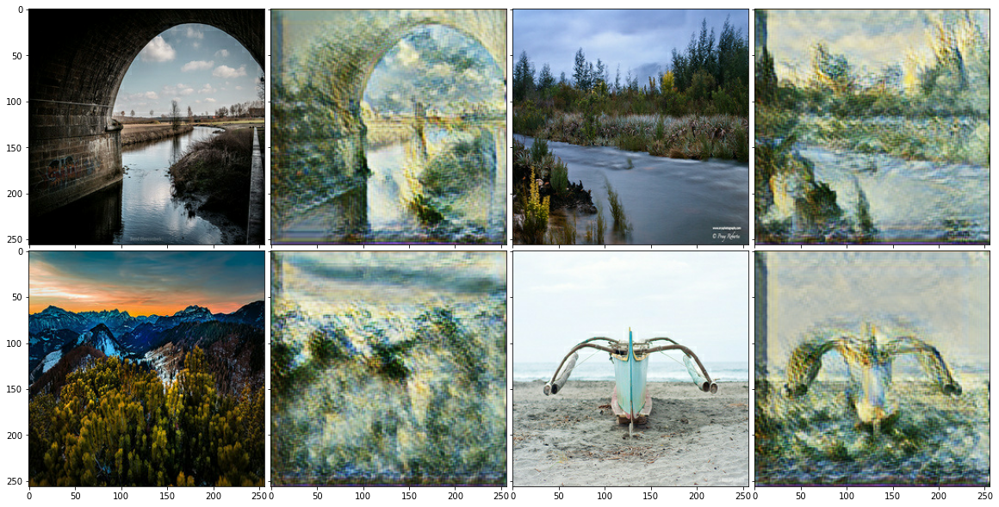

tf.Tensor([1823485.8 1907545.2 1779587.2 1758472.6], shape=(4,), dtype=float32)
tf.Tensor([1442544.1 1518651.1 1625742.9 1528096.1], shape=(4,), dtype=float32)
tf.Tensor([1822799.5 1906859.  1778901.  1757786.4], shape=(4,), dtype=float32)
tf.Tensor([1441887.  1517994.  1625085.8 1527439. ], shape=(4,), dtype=float32)
tf.Tensor([1822114.6 1906174.1 1778216.1 1757101.5], shape=(4,), dtype=float32)
tf.Tensor([1441220.6 1517327.6 1624419.4 1526772.6], shape=(4,), dtype=float32)
tf.Tensor([1821403.2 1905462.8 1777504.8 1756390.1], shape=(4,), dtype=float32)
tf.Tensor([1440664.9 1516771.9 1623863.6 1526216.9], shape=(4,), dtype=float32)
tf.Tensor([1820784.8 1904844.2 1776886.2 1755771.6], shape=(4,), dtype=float32)
tf.Tensor([1440046.6 1516153.6 1623245.4 1525598.6], shape=(4,), dtype=float32)
tf.Tensor([1820133.9 1904193.4 1776235.4 1755120.8], shape=(4,), dtype=float32)
tf.Tensor([1439491.1 1515598.1 1622689.9 1525043.1], shape=(4,), dtype=float32)
tf.Tensor([1819558.  1903617.5 1775659.5

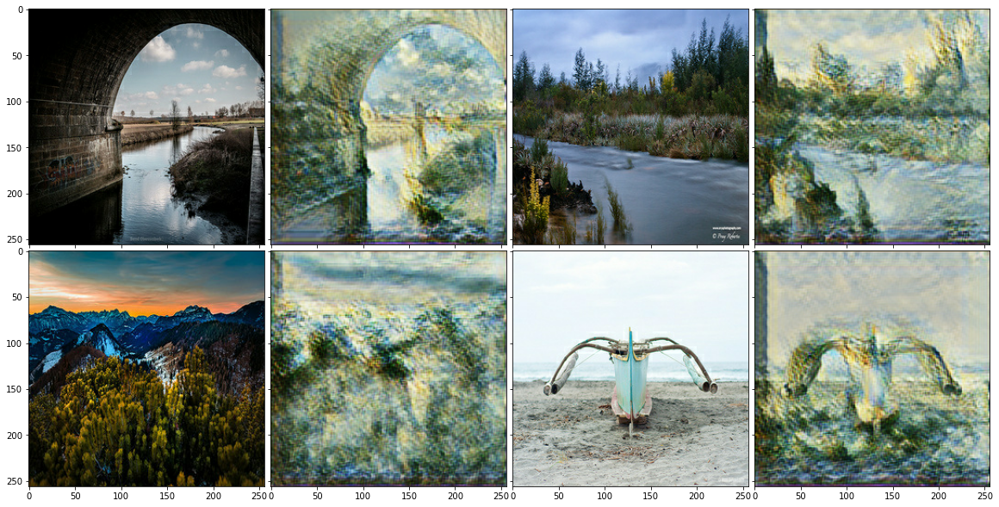

tf.Tensor([1204488.5 1280595.5 1387687.2 1290040.5], shape=(4,), dtype=float32)
tf.Tensor([1566514.  1650573.5 1522615.5 1501500.9], shape=(4,), dtype=float32)
tf.Tensor([1199282.9 1275389.9 1382481.6 1284834.9], shape=(4,), dtype=float32)
tf.Tensor([1566049.1 1650108.6 1522150.6 1501036. ], shape=(4,), dtype=float32)
tf.Tensor([1197769.9 1273876.9 1380968.6 1283321.9], shape=(4,), dtype=float32)
tf.Tensor([1563361.9 1647421.4 1519463.4 1498348.8], shape=(4,), dtype=float32)
tf.Tensor([1196791.4 1272898.4 1379990.1 1282343.4], shape=(4,), dtype=float32)
tf.Tensor([1561619.9 1645679.4 1517721.4 1496606.8], shape=(4,), dtype=float32)
tf.Tensor([1197213.1 1273320.1 1380411.9 1282765.1], shape=(4,), dtype=float32)
tf.Tensor([1560064.5 1644124.  1516166.  1495051.4], shape=(4,), dtype=float32)
tf.Tensor([1195696.5 1271803.5 1378895.2 1281248.5], shape=(4,), dtype=float32)
tf.Tensor([1558682.5 1642742.  1514784.  1493669.4], shape=(4,), dtype=float32)
tf.Tensor([1195236.  1271343.  1378434.8

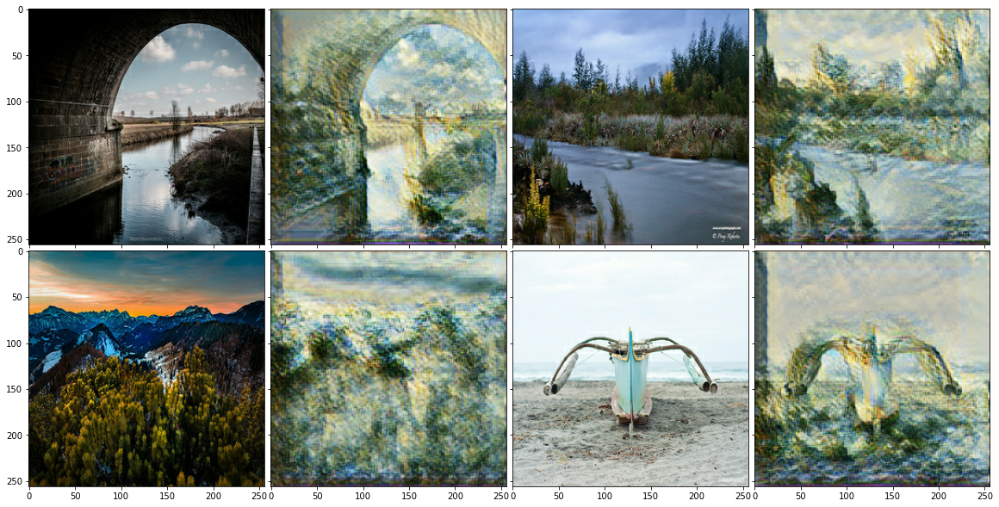

tf.Tensor([1075678.2 1151785.2 1258877.  1161230.2], shape=(4,), dtype=float32)
tf.Tensor([1424488.  1508547.5 1380589.5 1359474.9], shape=(4,), dtype=float32)
tf.Tensor([1077388.2 1153495.2 1260587.  1162940.2], shape=(4,), dtype=float32)
tf.Tensor([1427415.8 1511475.2 1383517.2 1362402.6], shape=(4,), dtype=float32)
tf.Tensor([1076470.  1152577.  1259668.8 1162022. ], shape=(4,), dtype=float32)
tf.Tensor([1436466.9 1520526.4 1392568.4 1371453.8], shape=(4,), dtype=float32)
tf.Tensor([1075900.5 1152007.4 1259099.2 1161452.4], shape=(4,), dtype=float32)
tf.Tensor([1437567.5 1521627.  1393669.  1372554.4], shape=(4,), dtype=float32)
tf.Tensor([1086026.2 1162133.2 1269225.  1171578.2], shape=(4,), dtype=float32)
tf.Tensor([1428476.  1512535.5 1384577.5 1363462.9], shape=(4,), dtype=float32)
tf.Tensor([1092087.9 1168194.9 1275286.6 1177639.9], shape=(4,), dtype=float32)
tf.Tensor([1430835.  1514894.5 1386936.5 1365821.9], shape=(4,), dtype=float32)
tf.Tensor([1084877.4 1160984.4 1268076.1

StopIteration: 

In [16]:
keras.backend.clear_session()
import time
import shutil
from mpl_toolkits.axes_grid1 import ImageGrid
plt.imshow(style_image[0])
plt.savefig("style.jpg")
plt.show()
with strategy.scope():
    #optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
    optimizer = tf.keras.optimizers.Adam(learning_rate=1E-4,beta_1=0.9, beta_2=0.999, epsilon=1e-08)
    model = JohnsonModel(extractor)

    model.compile(optimizer, )
    
    start = time.time()
    iterations = 0
    #while iter_train:
    #tuple_train = next(iter_train)
    for i in range(12): # 18*1200 seconds = 6 hours
        while (time.time()-start) < 1200:#1200:
            iterations += 1
            val = next(iter_train)
            #if(idx < 10):
            tuple_train = val
            model.train_step(tuple_train)#((content_image, style_image))
            #else:
            #    continue
        #content_image = next(i_photo)
        print(f"{i*20} minutes passed, {iterations} iterations")


        output = model(content_image)   
        im1 = content_image[0]
        im2 = output[0]
        im3 = content_image[1]
        im4 = output[1]
        im5 = content_image[2]
        im6 = output[2]
        im7 = content_image[3]
        im8 = output[3]

        fig = plt.figure(figsize=(20., 20.))
        grid = ImageGrid(fig, 111,  # similar to subplot(111)
                         nrows_ncols=(2, 4),  # creates 2x2 grid of axes
                         axes_pad=0.1,  # pad between axes in inch.
                         )

        for ax, im in zip(grid, [im1, im2, im3, im4, im5, im6, im7, im8]):
            # Iterating over the grid returns the Axes.
            ax.imshow(im)
        plt.savefig(f"outputs_{i*30}.jpg")
        plt.show()

#         model.save(f"model_{i*30}")


#         shutil.make_archive(f"model_{i*30}", 'zip', f"model_{i*30}")
#         shutil.rmtree(f"model_{i*30}")
        start = time.time()          


In [17]:
monet_generator = model

In [18]:
import PIL
! mkdir ../images

i = 1
photo_ds_test = iter(photo_ds)
for img in photo_ds_test:
    prediction = monet_generator(img, training=False).numpy()
    # prediction = monet_generator(img, training=False)[0].numpy()
    prediction = (prediction * 255 + 0).astype(np.uint8)
    for j in range(BATCH_SIZE):
        im = PIL.Image.fromarray(prediction[j])
        im.save("../images/" + str(i) + "_" + str(j) + ".jpg")
    i += 1
    if i*BATCH_SIZE > 7500:
        break

In [19]:
import shutil
shutil.make_archive("/kaggle/working/images", 'zip', "/kaggle/images")

'/kaggle/working/images.zip'